<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Preparing-to-model-the-data" data-toc-modified-id="Preparing-to-model-the-data-1">Preparing to model the data</a></span><ul class="toc-item"><li><span><a href="#Saving-the-model" data-toc-modified-id="Saving-the-model-1.1">Saving the model</a></span><ul class="toc-item"><li><span><a href="#Loading-the-model" data-toc-modified-id="Loading-the-model-1.1.1">Loading the model</a></span></li></ul></li></ul></li><li><span><a href="#Results" data-toc-modified-id="Results-2">Results</a></span><ul class="toc-item"><li><span><a href="#Testing-a-Review-with-LIME" data-toc-modified-id="Testing-a-Review-with-LIME-2.1">Testing a Review with LIME</a></span></li></ul></li><li><span><a href="#Testing-on-Product-Reviews" data-toc-modified-id="Testing-on-Product-Reviews-3">Testing on Product Reviews</a></span></li></ul></div>

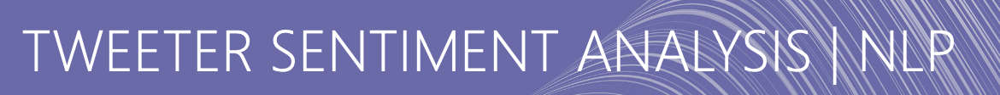

# Part 2 Deep Learning

To upload data to Google Colab, follow these steps:

In [1]:
# Create a  new folder
!mkdir .kaggle
## upload.json
# ! chmod 600 .kaggle/kaggle.json

In [2]:
# Changing the permissions of the kaggle.json 
! chmod 600 .kaggle/kaggle.json 

In [4]:
# Move to the root path
!mv .kaggle /root/

In [6]:
# download data from kaggle
!kaggle datasets download -d kazanova/sentiment140
!kaggle datasets download -d crowdflower/twitter-airline-sentiment

sentiment140.zip: Skipping, found more recently modified local copy (use --force to force download)
twitter-airline-sentiment.zip: Skipping, found more recently modified local copy (use --force to force download)


In [7]:
! unzip sentiment140.zip
! unzip twitter-airline-sentiment.zip


Archive:  sentiment140.zip
  inflating: training.1600000.processed.noemoticon.csv  
Archive:  twitter-airline-sentiment.zip
  inflating: Tweets.csv              
  inflating: database.sqlite         


In [8]:
# remove all zip file
!rm product-tweets-dataset.zip
!rm sentiment140.zip
!rm twitter-airline-sentiment.zip

rm: cannot remove 'product-tweets-dataset.zip': No such file or directory


In [9]:
# Import Sklearn libraries to build models 
from sklearn.feature_extraction.text import TfidfVectorizer # vectorize words 
from sklearn.metrics import classification_report, confusion_matrix 
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC

from sklearn.metrics import ConfusionMatrixDisplay
# from sklearn.metrics import plot_confusion_matrix
from sklearn.naive_bayes import GaussianNB

from sklearn.model_selection import GridSearchCV
# Import Libraries to perform computation and do visualization. 
import pandas as pd
import numpy as np
np.random.seed(0)
import seaborn as sns
import matplotlib.pyplot as plt
import string

# Import nltk to check english lexicon.
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet, stopwords
from nltk import word_tokenize, FreqDist
from nltk import pos_tag # for Parts of Speech tagging
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
# Generate wordcloud for word distribution visualization.
from wordcloud import WordCloud 

# Generating random numbers.
import random 

from xgboost import XGBClassifier

# Transforms text to a fixed-length vector of integers.
from gensim.models import Word2Vec 

import os

# !pip install -q textdistance
# import textdistance
#Efficient functions to search in strings.
import re as re 

# Import images for world cloud.
from PIL import Image, ImageDraw, ImageFont 


from tqdm.notebook import tqdm

from os import path
from os import environ

In [10]:
import tensorflow as tf

In [11]:
# !pip install tensorflow

In [12]:
# Uploading data 
DATASET_COLUMNS=["sentiment", "ids", "date", "flag", "user", "tweet"]
DATASET_ENCODING = "ISO-8859-1"
ta_df = pd.read_csv('training.1600000.processed.noemoticon.csv', 
                    encoding=DATASET_ENCODING, names=DATASET_COLUMNS)

ta_df.head() #View Tweets Data Frame

,sentiment,ids,date,flag,user,tweet
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


In [13]:
# Genarating a random sample of 1,000,000 tweets from a 1.6 million database 
ta_df = ta_df.sample(1000000,random_state=42)

In [14]:
# Checking shape
ta_df.shape

(1000000, 6)

In [15]:
# Dropping ‘flag’ and ‘ids’
ta_df.drop(['flag','ids'], axis=1, inplace = True)

In [16]:
# Checking tha the data is balanced 
ta_df['sentiment'].value_counts()

0    500167
4    499833
Name: sentiment, dtype: int64

In [17]:
# The variable target labeling in the data set is binary: 0 and 4, 
# where 0 represents the tweets that 
# are negative and 4 represents the tweets that are positive. 
ta_df['sentiment'] = ta_df['sentiment'].replace(4,1)
ta_df.head()

,sentiment,date,user,tweet
541200,0,Tue Jun 16 18:18:12 PDT 2009,LaLaLindsey0609,@chrishasboobs AHHH I HOPE YOUR OK!!!
750,0,Mon Apr 06 23:11:14 PDT 2009,sexygrneyes,"@misstoriblack cool , i have no tweet apps fo..."
766711,0,Tue Jun 23 13:40:11 PDT 2009,sammydearr,@TiannaChaos i know just family drama. its la...
285055,0,Mon Jun 01 10:26:07 PDT 2009,Lamb_Leanne,School email won't open and I have geography ...
705995,0,Sat Jun 20 12:56:51 PDT 2009,yogicerdito,upper airways problem


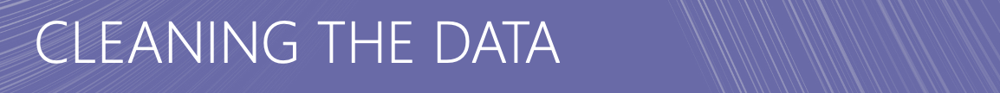

We repeat from Part 1 the preprocessing and cleaning the tweets data using the preprocess() function. 

In [18]:
tqdm.pandas() # Monitor completion 
ps = PorterStemmer() # defining and applying stemming to words in the text.

# text patterns that we want to remove from the text 
TEXT_CLEANING_RE = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"

# Replace 3 or more consecutive letters by 2 letter.
sequencePattern   = r"(.)\1\1+" 
seqReplacePattern = r"\1\1"
nltk.download('stopwords')
# Listst of common words we will removed from text.

stop_words = set(stopwords.words("english")) 

# The preprocess() function takes in the tweet and
# applies various text cleaning techniques to it.

def preprocess(text,apply_stem=True):
    
    # Remove link,user and special characters
    text = re.sub(TEXT_CLEANING_RE, ' ', str(text).lower()).strip()
    text = re.sub(sequencePattern, seqReplacePattern, text)
    
    tokens = [] # Initializing an empty list to store tokenized words.
    for token in text.split():
        if token not in stop_words:   # Checking if the word is not a stopword
            
            if apply_stem:
               # Stemming to the word using the PorterStemmer if True
                tokens.append(ps.stem(token))  
            else:
                # Adding the original word if stemming is not applied.
                tokens.append(token) 
    # Joining and retuning the list of tokenized words into a single string
    return " ".join(tokens)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [19]:
# Creating a new column in the DataFrame 
# Using lambda function aplying the 'preprocess()' 
# function to each row in the 'tweet' column.
ta_df['clean_tweet'] = ta_df['tweet'].progress_apply(lambda x:preprocess(x,True))

  0%|          | 0/1000000 [00:00<?, ?it/s]

In [20]:
# Creating a new column in the DataFrame without stemming  for wordcloud.
# Using lambda aplying the 'preprocess()' function to each row in the 'tweet' 
# column but adding 'false'.
ta_df['clean_tweet_wt_stem'] = ta_df['tweet'].progress_apply(lambda 
                                                        x:preprocess(x, False))

  0%|          | 0/1000000 [00:00<?, ?it/s]

In [21]:
# Splitting data target and clean tweets

X = ta_df['clean_tweet']#[:1000000]
y = ta_df['sentiment']#[:1000000]

In [22]:
# Spliting your dataset into training and testing sets. 
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.25, 
                                                    random_state = 43)

In [23]:
# Apllying tokenizing to the corpus using lambda
corpus = X.progress_apply(lambda line:line.split())

  0%|          | 0/1000000 [00:00<?, ?it/s]

In [24]:
# View corpus
corpus

541200                                       [ahh, hope, ok]
750                              [cool, tweet, app, razr, 2]
766711     [know, famili, drama, lame, hey, next, time, u...
285055     [school, email, open, geographi, stuff, revis,...
705995                              [upper, airway, problem]
                                 ...                        
21340      [bad, time, lap, top, broken, good, time, foun...
80620                               [yeah, fun, think, movi]
411912     [ministri, agricultur, forest, keep, take, cat...
798815              [sad, news, farrah, fawcett, pass, away]
1406049    [indo, pro, shop, trocar, meu, celular, quando...
Name: clean_tweet, Length: 1000000, dtype: object

In [25]:
# Train Word2Vec Model on corpus
WORD2VEC_MODEL = Word2Vec(corpus, 
                 min_count=1,          # word frequency
                 vector_size =300,      # dimention of word embeddings
                 workers=os.cpu_count(),            # Number of processors
                 sg=0 # default, 1 for skipgram and 0 for cbow
                ) 

In [26]:
# help(Word2Vec)

In [27]:
# Adding a new column and applying token to each row.
ta_df['tokens'] = ta_df['clean_tweet'].progress_apply(lambda line:line.split())

  0%|          | 0/1000000 [00:00<?, ?it/s]

When the DataFrame is filtered using this True if len(line) else False,
 only the rows with at least one token in the 'tokens' column will be retained.

In [28]:
# Removing rows from ta_df if the 'tokens' column contains an empty list 
ta_df = ta_df[ta_df['tokens'].apply(lambda line: True if len(line) else False)]

In [29]:
# all_word2vec_vocab = model.wv.vocab.keys()

In [30]:
# vocab_size = len(all_word2vec_vocab)

In [31]:
# Max charecter size for a tweet
W2V_SIZE = 300 # its vector dimention

In [32]:
# all_tokens = set(sum(ta_df['tokens'],[]))

In [33]:
# embedding_matrix = np.zeros((vocab_size, W2V_SIZE))

## Preparing to model the data

Given that the results were not great from our machine learning models, we will implement the Long Short-Term Memory (“LSTM”)  model, which works better with a larger data set. Therefore we increased our data to 1,000,000 tweets.

We are utilizing the deep model  LSTM to achieve better results. LSTM is a type of Recurrent Neural Network (RNN) a type of artificial neural network that is used to process sequential data.


In [34]:
# Importing Keras libraries
from keras.preprocessing.text import Tokenizer
# from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Activation, Dense, Dropout, Embedding, Flatten
from keras.layers import Conv1D, MaxPooling1D, LSTM
from keras import utils
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
# from keras_preprocessing.sequence import pad_sequences
# from keras.preprocessing.sequence import pad_sequences

In [35]:
# from keras_preprocessing.sequence import pad_sequences
# Downloading tensorflow library
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [36]:
%%time 
tokenizer = Tokenizer() # Initializing a new object 
tokenizer.fit_on_texts(X_train) # Tokenizer will learn the vocabulary of the text 
# data and assign a unique index to each word

vocab_size = len(tokenizer.word_index) + 1 # Vocabulary size (tokenizer reserves index 0)
print("Total words", vocab_size)

Total words 162955
CPU times: user 8.64 s, sys: 55.1 ms, total: 8.7 s
Wall time: 8.67 s


In [37]:
# tokenizer.word_index

In [38]:
# KERAS
# Maximum length of the tweet. 
SEQUENCE_LENGTH = 300 

#Number of times it passes through the training data. 
EPOCHS = 10

# Number of training examples/samples to process at once during each iteration.
BATCH_SIZE = 1024

# https://medium.com/@dclengacher/keras-lstm-recurrent-neural-networks-c1f5febde03d

In [39]:
max(X_train.apply(lambda x: len(x))) # the maximum length of the text

174

Converting the tweets in training and testing to sequences of word indices using the tokenizer then padding them to have a fixed length of 300.



In [40]:
# Converting training and testing data to sequences of word 
# indices to prepare for the model.
x_train = pad_sequences(tokenizer.texts_to_sequences(X_train), 
                        maxlen=SEQUENCE_LENGTH)
x_test = pad_sequences(tokenizer.texts_to_sequences(X_test), 
                       maxlen=SEQUENCE_LENGTH)

Word2Vec

Embedding matrix using a pre-trained Word2Vec model for words in the tweet learned by the tokenizer. The embedding matrix will be used to establish the weights of an embedding layer in a neural network.

In [41]:
embedding_matrix = np.zeros((vocab_size, W2V_SIZE)) # Initializing an empty
# embedding matrix with the shape
for word, i in tokenizer.word_index.items(): # Looping over each word in  tweet
  if word in WORD2VEC_MODEL.wv: # Checksing if the word is in Word2Vec model
    embedding_matrix[i] = WORD2VEC_MODEL.wv[word] # If yes, it assigns a vector
print(embedding_matrix.shape) # Printing shape

(162955, 300)


In [42]:
# embedding_matrix[95]

Creating an embedding layer using the Embedding class from Keras.

In [43]:
# Initializing embedding layers for our model 
embedding_layer = Embedding(vocab_size, W2V_SIZE, weights=[embedding_matrix], 
                            input_length=SEQUENCE_LENGTH, trainable=False)

Layers to LSTM model

In [44]:
KERAS_MODEL = Sequential() # Creating a new sequential model
KERAS_MODEL.add(embedding_layer) # Adding embedding layer to the model.

# Dropout is a fraction of the neurons will drop in a layer during training. 
KERAS_MODEL.add(Dropout(0.5)) # Adding a dropout layer 
# Adding LSTM hidden layer with 100 neurons

KERAS_MODEL.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2)) 
# Adding a dense output layer to the model with a one one output and 
# a sigmoid activation function
KERAS_MODEL.add(Dense(1, activation='sigmoid')) 

KERAS_MODEL.summary() # Print summary 

# https://heartbeat.comet.ml/using-a-keras-long-shortterm-memory-
# lstm-model-to-predict-stock-prices-a08c9f69aa74

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 300)          48886500  
                                                                 
 dropout (Dropout)           (None, 300, 300)          0         
                                                                 
 lstm (LSTM)                 (None, 100)               160400    
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 49,047,001
Trainable params: 160,501
Non-trainable params: 48,886,500
_________________________________________________________________


Compilying the model, specifying the binary cross-entropy loss function, the Adam optimizer, and the accuracy metric.


In [45]:
# Compilying the model

KERAS_MODEL.compile(loss='binary_crossentropy',
              optimizer="adam",
              metrics=['accuracy'])

Learning the rate when the validation loss stops improving, and EarlyStopping stops training when the validation accuracy stops improving.

In [46]:
# Initializing callback
callbacks = [ ReduceLROnPlateau(monitor='val_loss', patience=5, cooldown=0),
              EarlyStopping(monitor='val_accuracy', min_delta=1e-4, patience=5)]

In [47]:
x_train.shape

(750000, 300)

In [48]:
y_train.shape

(750000,)

In [49]:
history = KERAS_MODEL.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_split=0.1, 
                    verbose=1,
                    callbacks=callbacks)

Epoch 1/10
660/660 [==============================] - 591s 884ms/step - loss: 0.5105 - accuracy: 0.7455 - val_loss: 0.4719 - val_accuracy: 0.7728 - lr: 0.0010
Epoch 2/10
660/660 [==============================] - 572s 866ms/step - loss: 0.4881 - accuracy: 0.7614 - val_loss: 0.4689 - val_accuracy: 0.7754 - lr: 0.0010
Epoch 3/10
660/660 [==============================] - 571s 865ms/step - loss: 0.4800 - accuracy: 0.7668 - val_loss: 0.4583 - val_accuracy: 0.7797 - lr: 0.0010
Epoch 4/10
660/660 [==============================] - 569s 862ms/step - loss: 0.4746 - accuracy: 0.7701 - val_loss: 0.4535 - val_accuracy: 0.7829 - lr: 0.0010
Epoch 5/10
660/660 [==============================] - 584s 885ms/step - loss: 0.4706 - accuracy: 0.7731 - val_loss: 0.4527 - val_accuracy: 0.7838 - lr: 0.0010
Epoch 6/10
660/660 [==============================] - 574s 869ms/step - loss: 0.4686 - accuracy: 0.7742 - val_loss: 0.4535 - val_accuracy: 0.7850 - lr: 0.0010
Epoch 7/10
660/660 [==========================

### Saving the model


In [50]:
# Saving the model so that we don't need to keep training it.
KERAS_MODEL.save('keras_model.h5') # Saving LTSM
WORD2VEC_MODEL.save("model.w2v") # Saving Word2Vec

#### Loading the model

In [51]:
from tensorflow.keras.models import load_model # Import to load the model
# Loading  model
keras_model = load_model('keras_model.h5')

# summarize model.
# keras_model.summary()

## Results

In [52]:
# Showing Accuracy and Loss
score = keras_model.evaluate(x_test, y_test, batch_size=BATCH_SIZE)
print()
print("ACCURACY:",score[1])
print("LOSS:",score[0])

245/245 [==============================] - 26s 104ms/step - loss: 0.4517 - accuracy: 0.7864

ACCURACY: 0.7863839864730835
LOSS: 0.45171108841896057


 We are plotting the accuracy and loss values over the epochs of the model training, so we can get an idea of how the model is performing over time of the itteration in the neural network setting. 



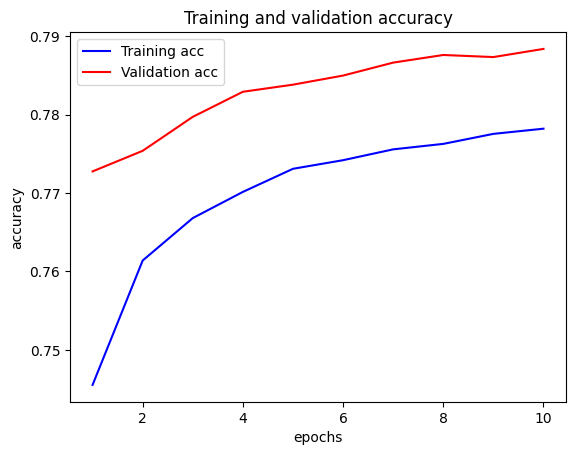

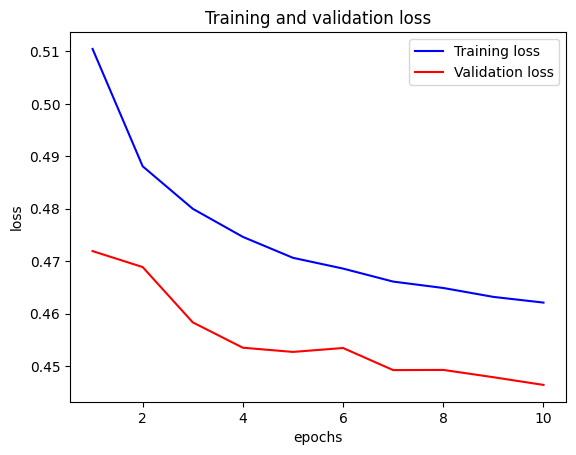

In [53]:
# Defining variables 

# Returning when calling the fit() method on a Keras LSTM model.
val_acc = history.history['val_accuracy']
acc = history.history['accuracy'] 
loss = history.history['loss']
val_loss = history.history['val_loss']
 
# it will give the epoch it stopped at after training or 0 if it didn't early stop.
n = callbacks[1].stopped_epoch

# get X axis range
n = range(1,EPOCHS+1) if n==0 else range(1,n+2)

# epochs = range(EPOCHS) # range object 10

# Ploting training accuracy over the epochs in blue.
plt.plot(n, acc, 'b', label='Training acc')
plt.plot(n, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel("epochs") # Labelng
plt.ylabel("accuracy") # Labelng
plt.legend()
 
plt.figure()

# Ploting training loss over the epochs in red.
plt.plot(n, loss, 'b', label='Training loss')
plt.plot(n, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel("epochs") # Labelng
plt.ylabel("loss") # Labeling
plt.legend()
 
plt.show()


# https://stackoverflow.com/questions/41908379/keras-plot-training-
#validation-and-test-set-accuracy

The training accuracy is increasing, and the validation accuracy is also increasing.
We are seeing the same patteren with the training loss graph. Loss is decreasing, and the validation loss as well. This suggests that the model is learning the patterns in the data and generalizing well to new data. In both graphs, when the epochs pass 6, the training and the vaidation are starting to get a little closer to one another. With higher than 10 epochs the model might be overfitting to the training data and not teaching the new data. 


In [54]:
y_test_1d = list(y_test)
scores = keras_model.predict(x_test, verbose=1, batch_size=1000)
y_pred_1d = [0 if score[0]<0.5 else 1 for score in scores ]

250/250 [==============================] - 25s 100ms/step


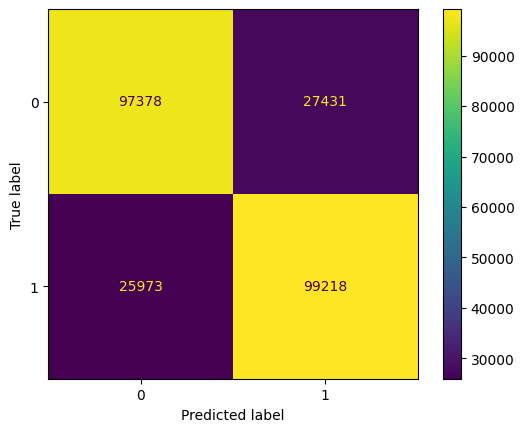

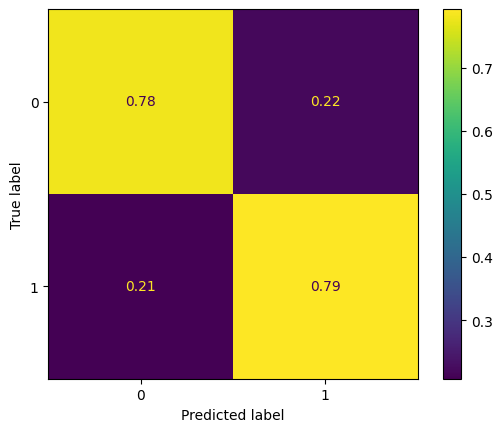

In [55]:
cm = confusion_matrix(y_test_1d,y_pred_1d)
cm1 = confusion_matrix(y_test_1d,y_pred_1d,normalize='true')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[0,1])
disp1 = ConfusionMatrixDisplay(confusion_matrix=cm1,display_labels=[0,1])
disp.plot()
disp1.plot()
plt.show()

In [56]:
print(classification_report(y_test_1d,y_pred_1d))

              precision    recall  f1-score   support

           0       0.79      0.78      0.78    124809
           1       0.78      0.79      0.79    125191

    accuracy                           0.79    250000
   macro avg       0.79      0.79      0.79    250000
weighted avg       0.79      0.79      0.79    250000



Accuracy: The accuracy is the proportion of correctly labled class as negative or positive tweet. In this case, the accuracy is 79%. the LSTM model correctly classified 79% of the time both negative and positive tweets.

# LIME

In [57]:
!pip install -q lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


We define a predict_proba function that takes a list of tweet texts as input, preprocesses and tokenizes the texts, and then returns the predicted probabilities for each class (negative and positive) using the LSTM model.

In [58]:
# Import to explain text classifiers.
from lime.lime_text import LimeTextExplainer 
class_names=[0,1]

def predict_proba(tweet_text):
  example = pad_sequences(tokenizer.texts_to_sequences(list(tweet_text)), 
                     maxlen=SEQUENCE_LENGTH) # Tokenizes the tweets then pads
  # Training LSTM predict sentiment probbilities
  pred=keras_model.predict(example) 
  returnable=[] # initializing list to store predicted probabilities. 
  for i in pred:
    temp=i[0]
     # Predictes for each class in all tweets
    returnable.append(np.array([1-temp,temp]))
  return np.array(returnable)
# https://towardsdatascience.com/interpreting-an-lstm-through-lime-e294e6ed3a03
  # print(pred)
  # temp = pred[0][0]
  # return np.array([1-temp,temp]).reshape(1,2)

In [59]:
# View test date
X_test

956610                                        spongebob isnt
483432                                                  rain
1523842                                       yay wait watch
48041      morn mother natur left monthli present fun fun...
366878                                              mess huh
                                 ...                        
560578                                            ack happen
916703                              happi mother day everyon
631662     sick cough fever bodi ach headach runni nose g...
549361                             hold anymor act like fine
283913     lt got call earli work b c dude work call mill...
Name: clean_tweet, Length: 250000, dtype: object

LIME (Local Interpretable Model-agnostic Explanations) provides an explanation for the prediction made by our LSTM on a specific tweet from the testing data.

> Indented block



In [60]:
print("Actual sentiment",y_test[1523842])
#  positive (orange), Negative (blue)

# Initializing a LimeTextExplainer object to explain the tweet. 
explainer= LimeTextExplainer(class_names=class_names) 
# Returning the predicted probabilities for each class.
exp = explainer.explain_instance(X_test[1523842],
                                 predict_proba).show_in_notebook(text=True)

Actual sentiment 1
157/157 [==============================] - 14s 86ms/step


The model predicts probabilities of 65% for the negative class and 35% for a positive class. This means that the model is more confident that the tweet is labeled as negative.

In [61]:
print("Actual sentiment",y_test[549361])
#  positive (orange), Negative (blue)
# Initializing a LimeTextExplainer object to explain the tweet. 
explainer= LimeTextExplainer(class_names=class_names)
exp = explainer.explain_instance(X_test[549361],
                                 predict_proba).show_in_notebook(text=True)

Actual sentiment 0
157/157 [==============================] - 14s 89ms/step


The model is very confident that the tweet belongs to the positive class, as the probability is 100%. 

### Testing a Review with LIME

In [62]:
# print("Actual sentiment",y_test[339425])
#  positive (orange), Negative (blue)
# explainer= LimeTextExplainer(class_names=class_names)
# Returning the predicted probabilities for each class.
exp = explainer.explain_instance("I wish the interface was easier to navigate.",
                                 predict_proba).show_in_notebook(text=True)

157/157 [==============================] - 13s 83ms/step


In [63]:
# https://www.reviews.io/company-reviews/store/tshirtfella

## Testing on Product Reviews

https://www.kaggle.com/datasets/crowdflower/twitter-airline-sentiment

# Airline Reviews on Twetter

For the business presentation, we will be conducting an analysis on a dataset containing actual customer feedback on a specific airline. This exercise primarily aims to demonstrate the potential insights that can be gained through data-driven approaches in enhancing our understanding of customer feedback.

In [64]:
# https://www.kaggle.com/datasets/crowdflower/twitter-airline-sentiment?select=Tweets.csv

# Reading and viewing data set (feedback tweets on arilines)
df_airline =  pd.read_csv('Tweets.csv')
df_airline.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


We are gathering equal amount of positive and negative tweets, resulting in a balanced dataset. Each sentiment category will have 2,363 tweets.

In [65]:
# Store only positive emotions
neg_al = df_airline[df_airline['airline_sentiment'].isin
                (['negative'])].sample(2363,random_state=42)

In [66]:
# Store only positive emotions
pos_al = df_airline[df_airline['airline_sentiment'].isin
                (['positive'])]

In [67]:
 #Merging the postive and negative tweets 
 df_airline = pd.concat([pos_al, neg_al])

In [68]:
# View dataframe 
df_airline.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
1,570301130888122368,positive,0.3486,NaN,0.0,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
6,570300616901320704,positive,0.6745,NaN,0.0,Virgin America,NaN,cjmcginnis,NaN,0,"@VirginAmerica yes, nearly every time I fly VX...",NaN,2015-02-24 11:13:57 -0800,San Francisco CA,Pacific Time (US & Canada)
8,570299953286942721,positive,0.6559,NaN,NaN,Virgin America,NaN,dhepburn,NaN,0,"@virginamerica Well, I didn't…but NOW I DO! :-D",NaN,2015-02-24 11:11:19 -0800,San Diego,Pacific Time (US & Canada)
9,570295459631263746,positive,1.0000,NaN,NaN,Virgin America,NaN,YupitsTate,NaN,0,"@VirginAmerica it was amazing, and arrived an ...",NaN,2015-02-24 10:53:27 -0800,Los Angeles,Eastern Time (US & Canada)
11,570289724453216256,positive,1.0000,NaN,NaN,Virgin America,NaN,HyperCamiLax,NaN,0,@VirginAmerica I &lt;3 pretty graphics. so muc...,NaN,2015-02-24 10:30:40 -0800,NYC,America/New_York


In [69]:
# View the tweets
df_airline['text']

1        @VirginAmerica plus you've added commercials t...
6        @VirginAmerica yes, nearly every time I fly VX...
8          @virginamerica Well, I didn't…but NOW I DO! :-D
9        @VirginAmerica it was amazing, and arrived an ...
11       @VirginAmerica I &lt;3 pretty graphics. so muc...
                               ...                        
894                          @united where's my damn bag??
9875     @USAirways 5 hours on the phone waiting for a ...
10003    @USAirways flight 838 now leaving after 6 hour...
11674    @USAirways flt 5302 CLT to DAY supposed to dep...
9786     @USAirways over two hours on hold to talk to a...
Name: text, Length: 4726, dtype: object

In [70]:
# Downloading Spacy

!python -m spacy download en_core_web_lg

2023-04-03 15:39:39.988248: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 2.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


get_entity function passes the tweets and stores them in the list 'entity'. It extracts organizations & products in the text and adds them to the list.

In [71]:
def get_entity(x):
  entity = [] # Initialize list 
  doc = nlp(x) # #xtract entities
  for ent in doc.ents:  # loops and checks for org. and product
    if ent.label_ in ('ORG', 'PRODUCT'):
      entity.append((ent.text, ent.label_)) # Adding to the list 
  return entity # Returns filtered data 

## Topic Modeling

Filtering through only the negative tweets and look for problems 
that people might be experiencing, 

In [133]:
import pandas as pd
import os
from tqdm.notebook import tqdm
tqdm.pandas()
import re
import spacy
import numpy as np
import seaborn as sns
from spacy.language import Language
from spacy import displacy
from gensim.models.ldamodel import LdaModel
from gensim.corpora.dictionary import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import warnings
warnings.filterwarnings('ignore')
# result = pd.DataFrame([],columns=['Corpus','No_of_Comments','No_of_Tokens'])


In [79]:
# loads the  language model of the spaCy library.
nlp = spacy.load('en_core_web_lg')

In [139]:
# Creating doc using nlp language model named entitie 
#doc = nlp(text)

In [78]:
# Creating a new column in the DataFrame called 'clean_tweet', 
# Which stores the cleaned tweets ,using'preprocess()' function without steming.
df_airline['clean_tweet'] = df_airline['text'].progress_apply(lambda x:preprocess(x,False))

  0%|          | 0/4726 [00:00<?, ?it/s]

We need to convert the cleaned tweets (x_test) into padded sequences of fixed length (SEQUENCE_LENGTH :300) using the tokenizer that we have previously defined. This step is essential for preparing the input data for a deep learning model, LTSM.

In [ ]:
# Importing the Spacy library 

We will be deploying topic modeling, which allow us to identfy the topics  presented in a the tweets reviews. 



The function returns the matrix as well as the tfidf_featurizer object, which can be used later to transform new text data into the same format as the training data.

* max_df = threshold for ignoring words that appear too frequently 
* min_df = parameter specifies the threshold for ignoring words that appear too infrequently.

The function returns the matrix as well as the tfidf_featurizer object, which can be used later to transform new text data into the same format as the training data.

In [81]:
def analysis(docs,vocab_size):

    # Sets up features for TF-IDF
    tfidf_featurizer = TfidfVectorizer(max_features=vocab_size, 
                                       max_df=0.95, stop_words='english')

    # count_text_vectors = count_text_vectorizer.fit_transform(docs)
   
    X_tfidf = tfidf_featurizer.fit_transform(docs) # Transform to TF-IDF
    
    # feature_names = tfidf_featurizer.get_feature_names_out()
    # X = X_tfidf.toarray()

    # return X,feature_names
    return X_tfidf,tfidf_featurizer

    # https://python.hotexamples.com/examples/sklearn.
    # feature_extraction.text/TfidfVectorizer/get_feature_names/
    # python-tfidfvectorizer-get_feature_names-method-examples.html

This function "plot_top_words" can be used to visualize the top words for each topic in a topic model and help interpret the results of the model.

* k_topic: number of topics
* model: our trained to vactorize
* n_top_words: top words to plot for each topic

In [111]:
# Plotting the top words/topics
def plot_top_words(k_topic,model, feature_names, n_top_words,title=''):
    plt.clf()
    cols = 3
    rows = int(np.ceil(k_topic/cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows), sharex=True)
    axes = axes.flatten()

    # Looping to iterate over the topics in a trained topic 
    # model and creates a horizontal bar chart for each topic. 
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[::-1][:n_top_words]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f'Topic {topic_idx + 1}',
                     fontdict={'fontsize': 15})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
       
        # Formatting  and display the plot created in the plot_top_function
        
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=15)
    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    fig.tight_layout()
    # fig.savefig(f'figure\{fname}.png')

    plt.show()

# https://github.com/scikit-learn/scikit-learn/blob/main/examples/
# applications/plot_topics_extraction_with_nmf_lda.py    

wordcloud_topics creating a wordcloud for each topic in the model by first iterating over the topics in the model. For each topic, it calculates the top no_top_words features based on the topic model coefficients and builds a dictionary that maps each feature to its respective weight.

In [112]:
# Wordcloud funciton 
def wordcloud_topics(model, features, no_top_words=50):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", stopwords = stopwords,
                       max_words=100, 
                       width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(7,7))
#         print(f'TOPIC - {topic}')
        plt.imshow(wc, interpolation='bilinear')
        plt.title(f'TOPIC - {topic}: top {no_top_words} words')

This function can be used to perform topic modeling on a collection of text documents and visualize the results in a meaningful way.

In [113]:
# Topic modeling function 
def get_topic_plot(data):
    docs = [] # Initializing list
    for tweet in tqdm(data): # loop through tweets 
        docs.append(tweet)  # add to the list

    # Merge the words into a single string 
    vocab_size = len(set(" ".join(docs).split(" ")))
    
    # Store outcome of the analysis funciton 
    X_tfidf,tfidf_vectorizer =  analysis(docs,vocab_size)

    X = X_tfidf.toarray() # Converting into a matrix for the model

    # Storing a list of the most important words for each topic.
    feature_names = tfidf_vectorizer.get_feature_names_out()
    
    # Convertinginto tokens
    tokens = [text.split() for text in docs]
    # Storing using class to map words to integers ids
    id2word = Dictionary(tokens)
    # Storing into corpus using method to generate no. of times word appears
    corpus = [id2word.doc2bow(text) for text in tokens]

    
    coh = []
    for i in tqdm(range(5,30)):
        model = LdaModel(corpus, i, id2word,random_state=42)
        cm = CoherenceModel(model=model, corpus=corpus, coherence='u_mass')
        coherence = cm.get_coherence()  # get coherence value
        coh.append(coherence)

    plt.plot(range(5,30),coh)
    plt.title('Coherence Score Vs Number of Topics (k)')
    plt.xlabel('Number of Topics (k)')
    plt.ylabel('Coherence Score')
    plt.show()

    k_topic = np.array(coh).argmax() + 5
    
    print('No of Topic Selected by Coherence Score:',k_topic)
    # LDA Model 
    lda_model = LatentDirichletAllocation(n_components=k_topic, random_state=42)
    lda_model.fit(X)
    plot_top_words(k_topic,lda_model, feature_names, 10)
    wordcloud_topics(lda_model, feature_names)

In [132]:
# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

We built a function arguments passing  x_test and y_test, converting the test data into padded sequences using tokenizer and sequence length. 

The function then generates predictions on the x_test which is the independent variables taked from the US airline data set -  using a pre-trained LSTM model. 

The predicted scores are thresholded at 0.5 to obtain predictions (0 = negative 1 = positive). We obtain the results using a confusion matrix and classification report. Finally, the function returns the binary predictions as a list for positive and negative tweets.

In [115]:
# Building funciton to predict 
def get_sentiment_prediction(x_test,y_test):
  x_test = pad_sequences(tokenizer.texts_to_sequences(x_test), maxlen=SEQUENCE_LENGTH)
  # Converting into list
  y_test_1d  = list(y_test) 
  # Generating predictions on the x_test
  scores = keras_model.predict(x_test, verbose=1, batch_size=50)
  
  # Setting up hreshold
  y_pred_1d = [0 if score[0]<0.5 else 1 for score in scores] 
  
  # Produciing Results
  cm = confusion_matrix(y_test_1d,y_pred_1d)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=[0,1])
  print(classification_report(y_test_1d,y_pred_1d))
  
  # Plotting
  disp.plot()
  plt.show()

  return y_pred_1d

Deploying our pre-trained LTSM Keras model and then converting the predictions into a binary format.

In [116]:
# Setting up variables 
x_test_al  = df_airline['clean_tweet']
y_test_al = df_airline['airline_sentiment'] # Target variable

In [117]:
# Replacing pos with 1 and neg with 0.
y_test_al = y_test_al.replace(['positive','negative'],[1,0])

In [118]:
# Checking that sentiments classes are balanced 
df_airline['airline_sentiment'].value_counts()

positive    2363
negative    2363
Name: airline_sentiment, dtype: int64

95/95 [==============================] - 8s 80ms/step
              precision    recall  f1-score   support

           0       0.79      0.61      0.69      2363
           1       0.68      0.84      0.75      2363

    accuracy                           0.73      4726
   macro avg       0.74      0.73      0.72      4726
weighted avg       0.74      0.73      0.72      4726



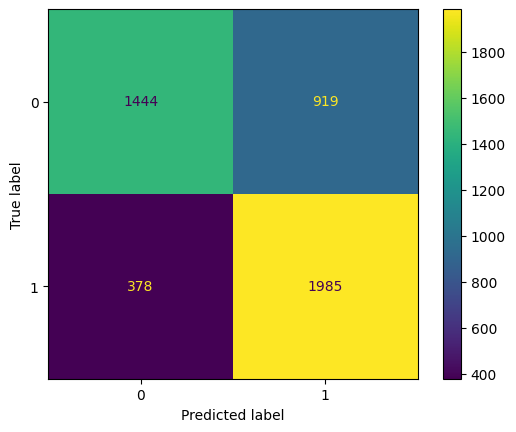

In [119]:
# Viewing scores: classification report and classification report
y_pred_al = get_sentiment_prediction(x_test_al,y_test_al)

In [120]:
# Storing the predicted values in a new column 

df_airline['pred_sentiment'] = y_pred_al

In [121]:
# Check upnique values
df_airline['airline'].unique()

array(['Virgin America', 'United', 'Southwest', 'Delta', 'US Airways',
       'American'], dtype=object)

In [122]:
# Filtering only for US Airways airline to check for negative tweets
df_us_al = df_airline[df_airline["airline"].str.contains('US Airways', case=False, na=False)]

In [123]:
# Checking filter 
df_us_al["airline"].unique()

array(['US Airways'], dtype=object)

In [124]:
# Filtering negative tweets to obtain topic
df_us_al_neg = df_us_al[df_us_al['pred_sentiment']==0]['clean_tweet']

In [125]:
# Checking the number of negative tweets
df_us_al_neg.shape

(408,)

In [126]:
# View negative tweets 
df_us_al_neg

8985     well miss gate agents rebooked boarding pass w...
9024     great job today team challenging weather delay...
9105                           waiting flight right thanks
9222                    worries flight attendant took care
9244     good work flight 1798 crew chairman recognitio...
                               ...                        
10271    tough night two 90 minute calls hold delayed p...
9875     5 hours phone waiting call back find luggage s...
10003    flight 838 leaving 6 hour mechanical delay nee...
11674    flt 5302 clt day supposed depart 5 51 6 20 sti...
9786     two hours hold talk agent disconnects trying t...
Name: clean_tweet, Length: 408, dtype: object

We are going to apply the LDA model to analyze which topics were discussed the most among the negative tweets concerning US airlines.

  0%|          | 0/408 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

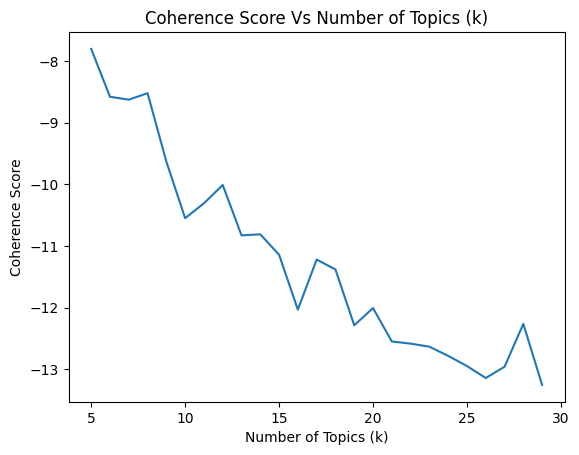

No of Topic Selected by Coherence Score: 5


<Figure size 640x480 with 0 Axes>

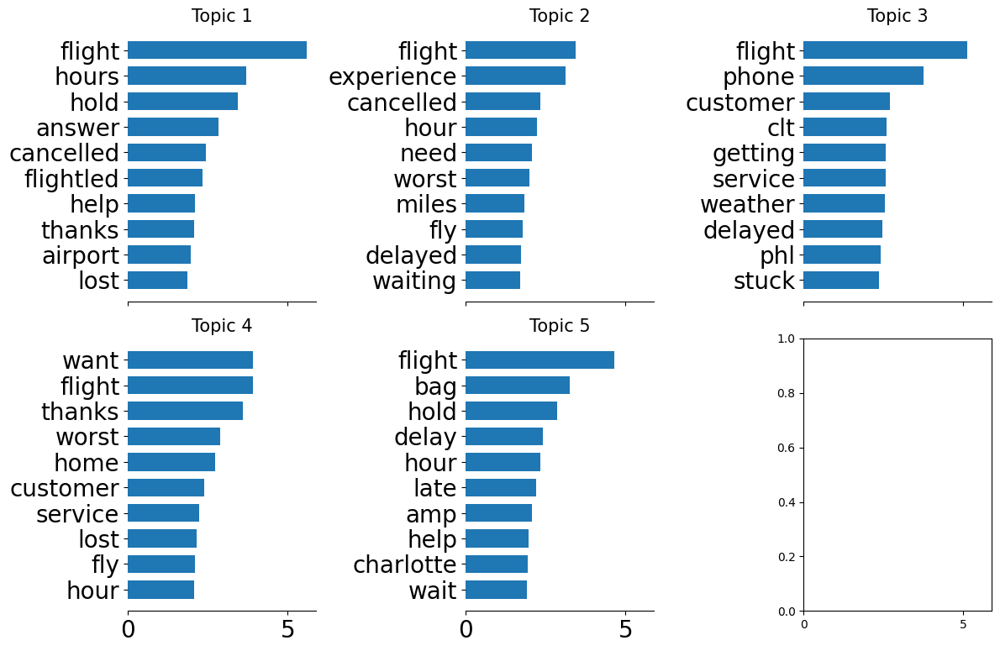

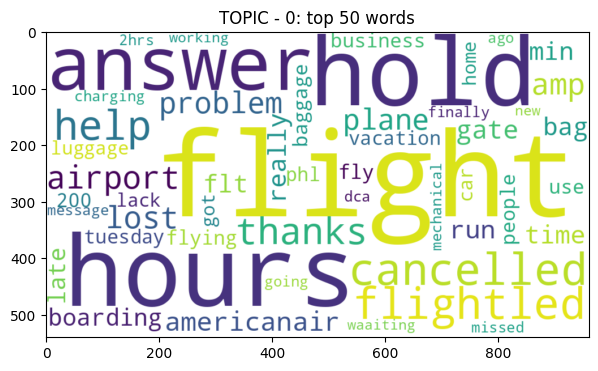

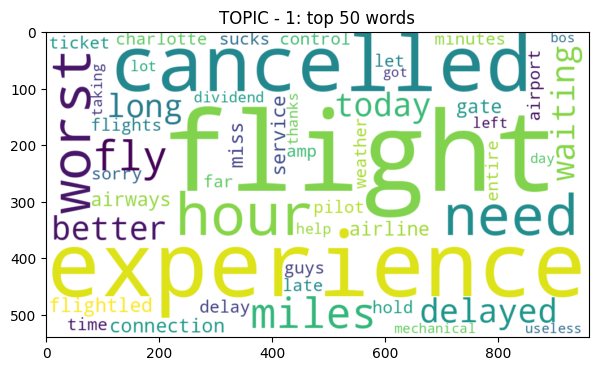

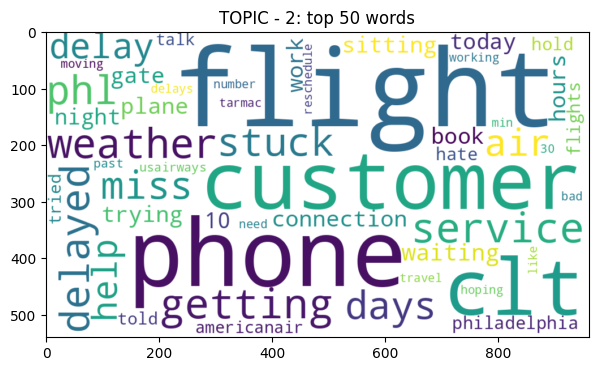

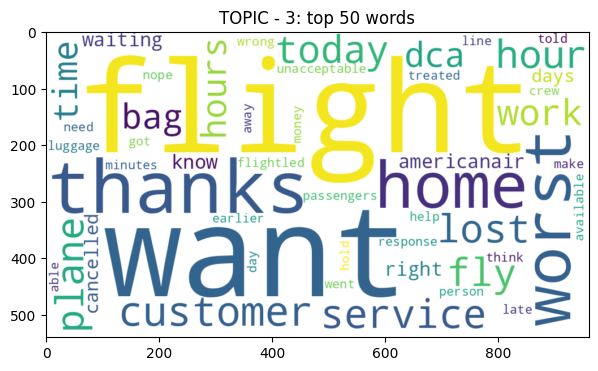

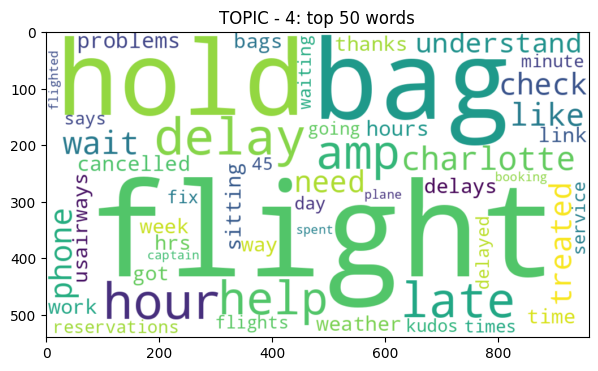

In [127]:
get_topic_plot(df_us_al_neg)

Using our model's tweet predictions, we filtered US Airlines' negative feedback and identified the main topics. Among them were customer service and flight delays.
Based on these tweets, it seems that customers are dissatisfied with US Airlines' customer service and frequent delays. This valuable feedback can be used to address these issues.


### LIME

LIME interprates the model in a simpler way. This allows us to gain insights into the contribution of each feature to the prediction, making it easier to understand the model's behavior.

In [135]:
# Use LIME to test a tweet
exp = explainer.explain_instance("might possibly worst airline ever think time brush customer service so rude.",
                                 predict_proba).show_in_notebook(text=True)

157/157 [==============================] - 14s 87ms/step


In [136]:
# Use LIME to test a tweet
exp = explainer.explain_instance("worst customer service line called 8 times today  able talk real human", predict_proba).show_in_notebook(text=True)

157/157 [==============================] - 13s 85ms/step


In [137]:
# Use LIME to test a tweet
exp = explainer.explain_instance("impressed customer service everyone unhelpful incredibly rude", predict_proba).show_in_notebook(text=True)

157/157 [==============================] - 12s 79ms/step


In [138]:
# Use LIME to test a tweet

exp = explainer.explain_instance("waiting luggage flight 1923 delay", predict_proba).show_in_notebook(text=True)

157/157 [==============================] - 13s 80ms/step


**Conclusion**

In conclusion, we employed various models for sentiment analysis and found that the LSTM model outperformed the others. With training on one million tweets, the model achieved a prediction accuracy of 79%. To demonstrate its real-world application, we used the model to analyze airline feedback tweets, accurately predicting sentiments 71% of the time.

To gain further insights, we applied an LDA model for topic modeling, focusing specifically on negative tweets. The topics that emerged revealed that customers are predominantly dissatisfied with US Airlines' customer service and frequent delays. This valuable feedback can help airlines address these issues and make improvements in the areas that matter most to their customers. By continuously refining and applying such sentiment analysis models, businesses can gain actionable insights from customer feedback and enhance their products and services accordingly.
